In [3]:
import kraken
import PIL
import numpy


In [4]:
from surya.detection import DetectionPredictor

print("Surya import OK")

c:\Users\workstation\.conda\envs\env_cv_modern\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Surya import OK


In [5]:
from pathlib import Path

model_path = Path("models/muharaf_seg_best.mlmodel")

print("Exists:", model_path.exists())
print("Size MB:", model_path.stat().st_size / (1024 * 1024))

Exists: True
Size MB: 4.83476448059082


In [7]:
from src.cv.line_detector import LineDetector

detector = LineDetector(
    backend="kraken",
    model_path="models/muharaf_seg_best.mlmodel",
    device="cpu"
)

print("Backend:", detector.backend)

Backend: kraken


In [8]:
from datasets import load_dataset

pages = load_dataset(
    "TheRealOKAI/muharaf-public-pages",
    split="train",
    streaming=True
)

sample = next(iter(pages))

print(sample.keys())

dict_keys(['id', 'image', 'text'])


Ground truth length: 808


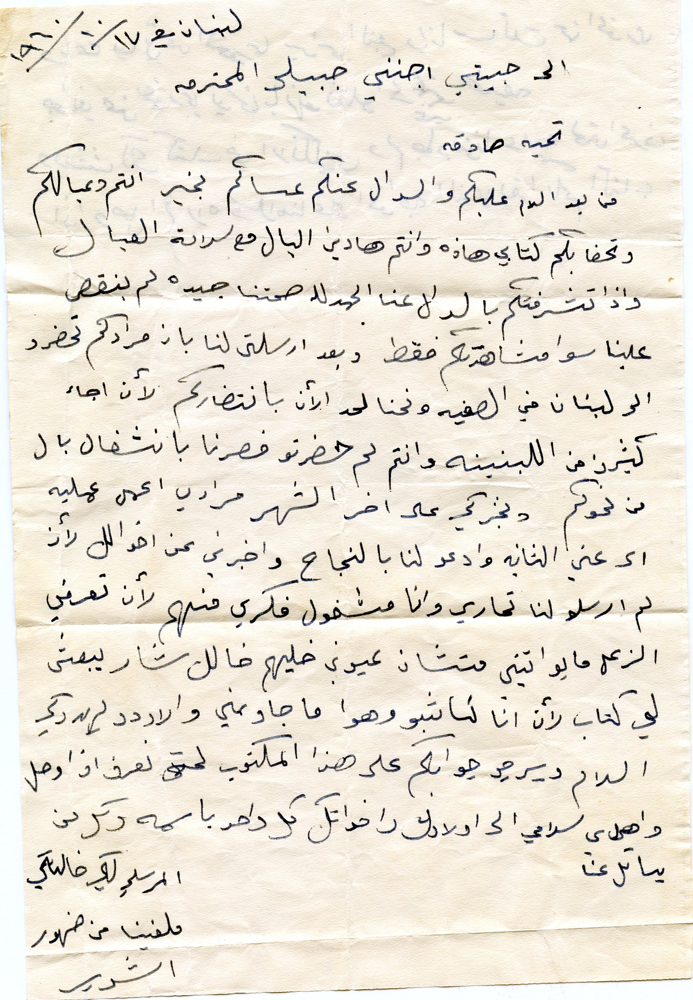

In [9]:
page_image = sample["image"].convert("RGB")
ground_truth = sample["text"]

print("Ground truth length:", len(ground_truth))
display(page_image)

In [10]:
lines = detector.detect(
    page_image,
    return_crops=True
)

print("Detected lines:", len(lines))

Detected lines: 18


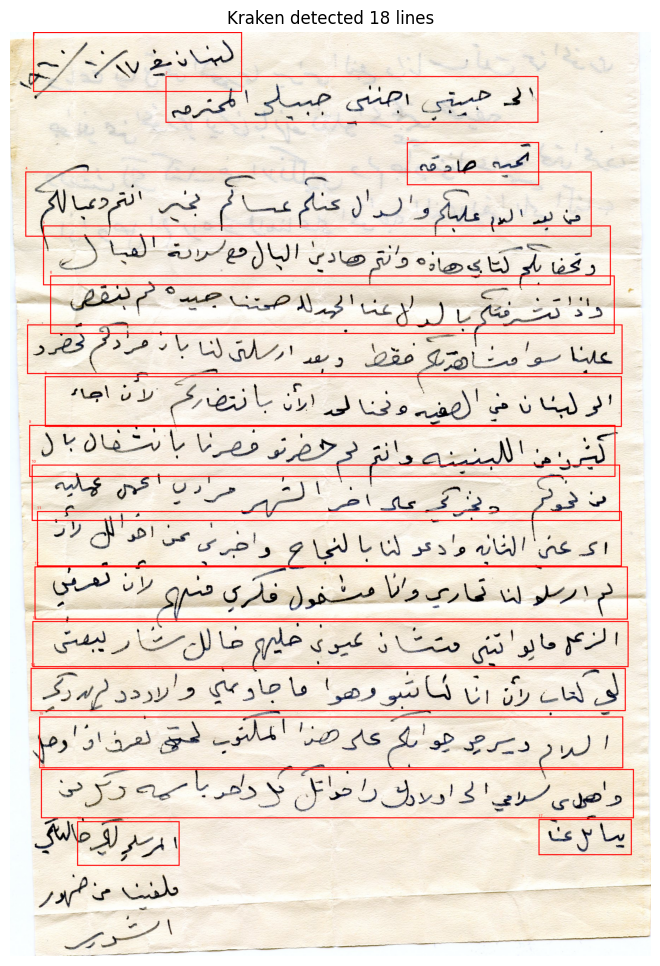

In [11]:
from PIL import ImageDraw
import matplotlib.pyplot as plt

preview = page_image.copy()
draw = ImageDraw.Draw(preview)

for i, line in enumerate(lines):

    x1, y1, x2, y2 = line["bbox"]

    draw.rectangle(
        [x1, y1, x2, y2],
        outline="red",
        width=3
    )

    draw.text(
        (x1, max(0, y1 - 15)),
        str(i + 1),
        fill="red"
    )

plt.figure(figsize=(16, 12))
plt.imshow(preview)
plt.axis("off")
plt.title(f"Kraken detected {len(lines)} lines")
plt.show()

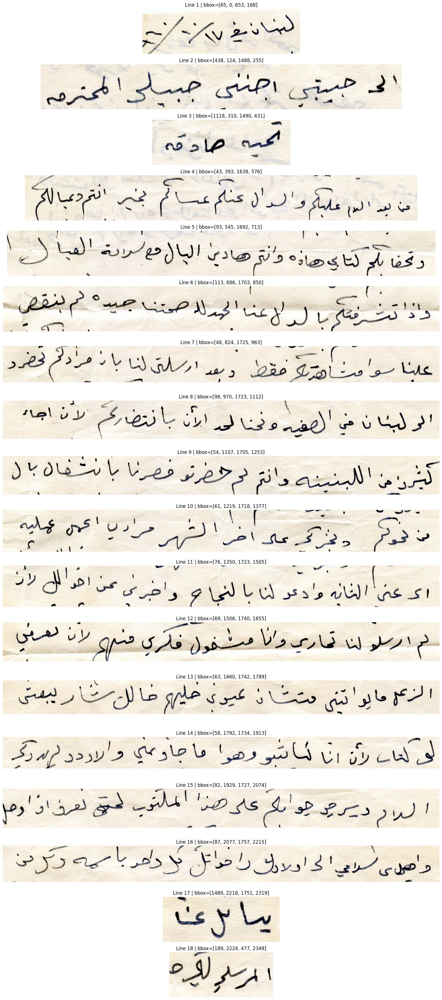

In [12]:
fig, axes = plt.subplots(
    len(lines),
    1,
    figsize=(16, max(4, len(lines) * 2))
)

if len(lines) == 1:
    axes = [axes]

for i, line in enumerate(lines):

    axes[i].imshow(line["crop"])
    axes[i].set_title(
        f"Line {i + 1} | bbox={line['bbox']}"
    )
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [15]:
from huggingface_hub import snapshot_download
import sys

# Download/cache Muharaf OCR model
muharaf_path = snapshot_download(
    repo_id="sdkv2/muharaf-arabic-ocr"
)

# Make the repository importable
sys.path.insert(0, muharaf_path)

from submission_code.torch_models import (
    load_ctc_backbone,
    recognise_line
)

# Load OCR model
ocr_model, charset, cfg = load_ctc_backbone(
    f"{muharaf_path}/models/ctc_backbone/model.pt"
)

print("Muharaf OCR loaded successfully!")

Fetching 57 files: 100%|██████████| 57/57 [00:00<00:00, 1869.47it/s]

Muharaf OCR loaded successfully!



C:\Users\workstation\.cache\huggingface\hub\models--sdkv2--muharaf-arabic-ocr\snapshots\e75d511257d6a0c0ffdede92308e8e022c79e1c5\submission_code\torch_models.py:175: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  self.encoder = nn.TransformerEncoder(encoder_layer, num_layers=num_encoder_layers)


In [18]:
ocr_texts = []

for i, line in enumerate(lines):

    text = recognise_line(
        ocr_model,
        charset,
        line["crop"]
    )

    ocr_texts.append(text)

    print(f"Line {i + 1}:")
    print(text)
    print("-" * 70)

Line 1:
طبنان فيي ١/٠
----------------------------------------------------------------------
Line 2:
الى جيي اجني جبيل المحترمه
----------------------------------------------------------------------
Line 3:
الحية صادقه
----------------------------------------------------------------------
Line 4:
من بعد الوم عليكم والسدال عنكم عساكم بخير انتم وعبالكم
----------------------------------------------------------------------
Line 5:
وتحضا بلكم كتابي هاذه وانتم هادين البال مع نسراة العبال
----------------------------------------------------------------------
Line 6:
واذ تشرفتكم بالدال عنا الحدله صحتنا جيده لم بنقص
----------------------------------------------------------------------
Line 7:
علينا سوامشاخدته حقط وبعد ارسلتى لنا باز مرادكم لحضرد
----------------------------------------------------------------------
Line 8:
الولبنان في الصفيه ونحنا لحد ارأن بنتضارم لان اجاء
----------------------------------------------------------------------
Line 9:
كثير من اللبنينه وانتم لم حضرتو فصرنا بانش

In [19]:
page_ocr_text = "\n".join(ocr_texts)

print("=" * 70)
print("RECONSTRUCTED OCR TEXT")
print("=" * 70)
print(page_ocr_text)

RECONSTRUCTED OCR TEXT
طبنان فيي ١/٠
الى جيي اجني جبيل المحترمه
الحية صادقه
من بعد الوم عليكم والسدال عنكم عساكم بخير انتم وعبالكم
وتحضا بلكم كتابي هاذه وانتم هادين البال مع نسراة العبال
واذ تشرفتكم بالدال عنا الحدله صحتنا جيده لم بنقص
علينا سوامشاخدته حقط وبعد ارسلتى لنا باز مرادكم لحضرد
الولبنان في الصفيه ونحنا لحد ارأن بنتضارم لان اجاء
كثير من اللبنينه وانتم لم حضرتو فصرنا بانشغال بال
من ولكم وبخرر على اخر الشهر مرادي اعم عليه
اى عني الثانيه وادعو لنا بالنجاح واخبرني عن اخولل لا
لم ارسلالنا تحاري وانا مشخول فري منه لان تعرفي
الزعى مايو الين متشان عيون خليهم خالك شا يبعت
الى كتات رن انا لتاننو وهوا ما جاد مي والاددد لبدكر
السدام ديرح جواكم على هذا الملتوب لح لعرث اذ ادصل
واهل ى سدامي الى اولاك راخواتل ك داحد باه دكر من
يسالل عنا
الرسلوليه


In [21]:
print("=" * 80)
print("GROUND TRUTH")
print("=" * 80)
print(ground_truth)

print("\n" + "=" * 80)
print("KRAKEN + MUHARAF OCR")
print("=" * 80)
print(page_ocr_text)

GROUND TRUTH
لبنان في ١٧/١٠/١٩٦٠
الى حبييتي اجنني جبيلي المحترمه
تحية صادقه
من بعد السلام عليكم والسوال عنكم عساكم بخير انتم وعيالكم
وتحفا بكم كتابي هاذه وانتم هادين البال مع سلامة العيال
واذا تشرفتم بالسؤال عنا الحمدلله صحتنا جيده لم ينقص
علينا سوا مشاهدتكم فقط وبعد ارسلتى لنا بان مرادكم تحضرو
الى لبنان في الصفيه ونحنا لحد الأن بانتظاركم لأن اجاء
كثيرن من اللبنينه وانتم لم حضرتو فصرنا بانشغال بال 
من نحوكم ونخبركي على اخر الشهر مرادي اعمل عمليه
الى عني الثانيه وادعو لنا بالنجاح واخبرني عن اخوالك لأن
لم ارسلو لنا تحارير وانا مشغول فكري فيهم لأن تعرفي
الزعل ما يواتيني منشان عيوني خليهم خالك شار يبعتني 
لي كتاب لأن انا كاتبتو وهوا ما جاوبني والاردد بريد دكي
السلام ويرجو جوابكم على هذا المكتوب لحتى نعرف اذا وصل
واصل ي سلامي الى اولادك واخواتك كل واحد باسمه وكل من 
يسائل عنا
المرسلي لكي خالةي
ملفينا من ضهور
الشوير

KRAKEN + MUHARAF OCR
طبنان فيي ١/٠
الى جيي اجني جبيل المحترمه
الحية صادقه
من بعد الوم عليكم والسدال عنكم عساكم بخير انتم وعبالكم
وتحضا بلكم كتابي هاذه وانتم هادين البال مع نسراة

In [24]:
import sys
!{sys.executable} -m pip install rapidfuzz

  Using cached rapidfuzz-3.14.5-cp310-cp310-win_amd64.whl.metadata (12 kB)
Using cached rapidfuzz-3.14.5-cp310-cp310-win_amd64.whl (1.5 MB)


In [25]:
import re
import unicodedata
from rapidfuzz.distance import Levenshtein


def normalize_arabic(text):
    if text is None:
        return ""

    text = str(text)
    text = unicodedata.normalize("NFC", text)

    # Remove tatweel
    text = text.replace("ـ", "")

    # Remove Arabic diacritics
    text = re.sub(
        r"[\u0617-\u061A\u064B-\u065F\u0670]",
        "",
        text
    )

    # Basic normalization
    text = text.replace("أ", "ا")
    text = text.replace("إ", "ا")
    text = text.replace("آ", "ا")
    text = text.replace("ى", "ي")

    # Normalize whitespace
    text = re.sub(r"\s+", " ", text).strip()

    return text


def calculate_cer(reference, prediction):
    reference = normalize_arabic(reference)
    prediction = normalize_arabic(prediction)

    if not reference:
        return 0.0 if not prediction else 1.0

    distance = Levenshtein.distance(
        reference,
        prediction
    )

    return distance / len(reference)


print("CER utilities loaded.")

CER utilities loaded.


In [26]:
import pandas as pd
from datasets import load_dataset

pages = load_dataset(
    "TheRealOKAI/muharaf-public-pages",
    split="train",
    streaming=True
)

benchmark_results = []

for i, sample in enumerate(pages):

    if i >= 10:
        break

    image = sample["image"].convert("RGB")
    ground_truth = sample["text"]

    # Line segmentation
    lines = detector.detect(
        image,
        return_crops=True
    )

    # OCR
    ocr_lines = []

    for line in lines:
        text = recognise_line(
            ocr_model,
            charset,
            line["crop"]
        )
        ocr_lines.append(text)

    prediction = "\n".join(ocr_lines)

    cer = calculate_cer(
        ground_truth,
        prediction
    )

    benchmark_results.append({
        "page": i,
        "detected_lines": len(lines),
        "ground_truth_chars": len(ground_truth),
        "ocr_chars": len(prediction),
        "CER": cer
    })

df = pd.DataFrame(benchmark_results)

print(df)
print()
print(f"Mean CER: {df['CER'].mean():.4f}")

   page  detected_lines  ground_truth_chars  ocr_chars       CER
0     0              18                 808        727  0.193789
1     1              21                 852        817  0.141509
2     2              16                 286        261  0.356643
3     3              16                 395        362  0.233933
4     4              19                1144       1100  0.130167
5     5              20                1212       1140  0.123333
6     6              21                 920        841  0.192771
7     7              21                 724        695  0.204703
8     8              18                 913        853  0.163175
9     9              19                 968        853  0.311579

Mean CER: 0.2052
